
This is my submission for the Project 4: Advanced Lane Finding for the Udacity Self-Driving Car NanoDegree Program.
Kelly Smith
Janurary 25, 2017


In [3]:
# Imports
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import pickle
import os.path

In [34]:
"""
Define constants for pipeline
"""

# Camera Calibration filename 
calibrationFilename = "CameraCalibration.p"

# Limit to the amount of change in the x-coordinate of the peak from one row to the next. 
dxLim = 100 # pixels

# Define constants for lane detection logic
sufficientHits = 500 # Minimum number of activated pixels within a region required for   
numYBins=10

# Warping Source Points
warpSrcPoints = np.float32([ [545, 450], [725, 450], [1280, 720], [0, 720] ])

# Warp Destination Points
imgShape = [720, 1280]
inset = 100
warpDstPoints = np.float32([ [inset,0], [imgShape[1]-inset, 0], 
    [imgShape[1]-inset,imgShape[0]], [inset,imgShape[0]] ])

ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meteres per pixel in x dimension

# -- Deprecated -- This defines thresholds (min, max) for my `create_binary_img` function (since un-used) 
thresholds = {'SobelX':[0, 255], 'hls':[100, 255]}

In [35]:
"""
This is my setup routine that loads the existing camera calibration matrix 
and the matrix for performing the perspective transform  
"""
def setup(Recalibrate=False):
    # Obtain camera coeffiicents
    mtx, dist = get_camera_calibration_data(Recalibrate)

    # Get perspective transform matrix M
    M = get_perspective_transform([720, 1280])
    return mtx, dist, M

In [36]:
"""
Manager function that either calibrates or loads existing calibration data if it exists
"""
def get_camera_calibration_data(Recalibrate, Debug=False):
    # Calibrate the camera, if commanded by the user or if no pickled data exists.
    if Recalibrate or not os.path.isfile(calibrationFilename):
        if Debug: 
            print("Calibrating camera...",end='')
        chessBoardSize = (9,6)
        mtx, dist = calibrateCamera(chessBoardSize)
        if Debug:
            print("Complete!")
            print("mtx = " + str(mtx))
            print("dist = " + str(dist))

        calibration_test(mpimg.imread('camera_cal/calibration10.jpg'), mtx, dist)
        
    else:
        if Debug:
            print("Loading existing caliberation data...", end='')
        x = loadCalibrationData()
        mtx = x['mtx']
        dist = x['dist']
        if Debug:
            print("Complete!")
    return mtx, dist

In [37]:
"""
Code to calibrate the camera (computing distortion coefficients).
I wrote this original code in just a text file and copy-pasted it 
into this notebook; the pasting appears to have introduced a weird tab/spacing issue.
"""
def calibrateCamera(chessBoardSize):
	

	images = glob.glob('camera_cal/calibration*.jpg')
	# images = glob.glob('calibration_wide/GOPR*.jpg')

	objpoints = []
	imgpoints = []

	objp = np.zeros((chessBoardSize[0]*chessBoardSize[1],3), np.float32)
	objp[:,:2] = np.mgrid[0:chessBoardSize[0], 0:chessBoardSize[1]].T.reshape(-1,2) # x, y coordinates

	ctr = 1
	n = len(images)
	for filename in images:
		print("(%d/%d)" % (ctr, n))
		ctr += 1
		# read in each image
		img = mpimg.imread(filename)

		# Convert to grayscale
		gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

		# Find chessboard corners
		ret, corners = cv2.findChessboardCorners(gray, chessBoardSize, None)

		if ret == True:
			imgpoints.append(corners)
			objpoints.append(objp)
		else:
			print("WARNING: Calibration on %s failed." % (filename))

	# Calibrate the camera
	ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

	# Save the camera calibration data
	saveCalibrationData(mtx, dist, rvecs, tvecs)
	
	# Return the Camera matrix (mtx) and Distortion Coefficients (dist)
	return (mtx, dist)

In [38]:
"""
Serialize the camera calibration data via pickle.
"""
def saveCalibrationData(mtx, dist, rvecs, tvecs):
	x = {"mtx":mtx, "dist":dist}
	# calibrationFilename = "CameraCalibration.p"
	with open (calibrationFilename,"wb") as output_file:
		pickle.dump(x, output_file)
		print("Saved the Camera Calibration data to %s" % calibrationFilename)

In [39]:
"""
Loads serialized camera calibration data from pickle file.
"""
def loadCalibrationData():
	with open (calibrationFilename,"rb") as input_file:
		x = pickle.load(input_file)
	return x

## Undistort Demonstration
The cell below demonstrates the camera calibration on one of the camera calibration images.  Note that the original image bows near the top of the checkerboard pattern and that the undistorted image eliminates this radial distortion.

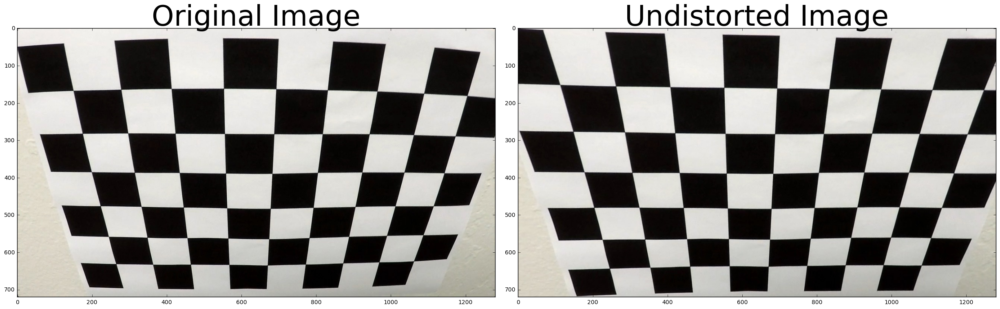

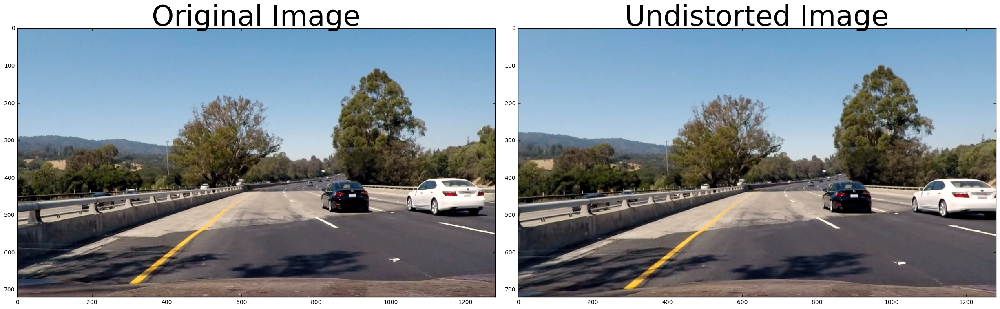

In [50]:
"""
This function undistorts a test image and plots the original and undistorted images.
"""
def calibration_test(img, mtx, dist):
	undistorted = undistort_img(img, mtx, dist)

	f, (ax1, ax2) = plt.subplots(1,2,figsize=(24,9))
	f.tight_layout()
	ax1.imshow(img)
	ax1.set_title('Original Image',fontsize=50)
	ax2.imshow(undistorted)
	ax2.set_title('Undistorted Image', fontsize=50)
	plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
	plt.show()
    
# Load the existing undistortion parameters
mtx, dist, M = setup()

# Load the image
img = mpimg.imread('camera_cal/calibration2.jpg')

# Run the calibration test
calibration_test(img, mtx, dist)
calibration_test(mpimg.imread('test_images/test4.jpg'), mtx, dist)

## Pipeline utilities
The functions below are many of the utility functions that are used to handle each step of the image processing pipeline.

In [41]:
"""
Undistort the image using camera calibration.
"""
def undistort_img(img, mtx, dist):
	undistorted = cv2.undistort(img, mtx, dist, None, mtx)
	return undistorted

In [42]:
"""
This was my attempt to create a thresholded binary image.  I experimented with 
Sobel-x edge detection, magnitude of Sobel-x and Sobel-y, and using the Saturation layer
from an HLS representation of the image.

Ultimately, I did not use this function because I found the Udacity-provided thresholding function
to be more robust. The Udacity version also included fewer false positives.

"""
def create_binary_img(img, thresholds):
    # Use color transforms, gradients to get thresholded binary image
    
    # Layers
    # 1. Grayscale Sobel-x edge detection
    # 2. Directed edge detetions
    # 3. RSS of Sobel-x and Sobel-y
    # 4. Image Saturation layer

    # Convert to grayscale
    
    # raw_sobelx = sobelx(img)
    # Apply thresholds
    # binary_sobelx = raw_sobelx
    # binary_sobelx = np.zeros_like(raw_sobelx)
    # binary_sobelx[(binary_sobelx >= thresholds['SobelX'][0]) & (binary_sobelx <= thresholds['SobelX'][1])] = 1

    binary_hls = hlsSelect(img, thresholds['hls'])
    binary_sobel = mag_thresh(img)

    # Perform Sobel-x and take absolute value to find edges
    # sobelx8 = sobelx(gray)

    # Apply threshold
    # sxbinary = np.zeros_like(sobelx8)
    # sxbinary[(sobelx8 >= thresholds[0]) & (sobelx8 <= thresholds[1])] = 1

    # Merge layers
    # merged_binary = cv2.bitwise_or(binary_hls, binary_sobel)
    merged_binary = np.zeros_like(img)
    merged_binary[(binary_hls==1)] = 1 # | (binary_sobel==1)] = 1
    
    # combined_binary = np.zeros_like(sxbinary)
    # combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1


    return merged_binary

In [43]:
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output

In [44]:
"""
Saturation layer thresholding from HLS color image.  Re-used from lectures.
"""
def hlsSelect(img, thresholds):
	hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
	s_channel = hls[:,:,2]

	binary_output = np.zeros_like(s_channel)
	binary_output[(s_channel > thresholds[0]) & (s_channel <= thresholds[1])] = 1
	return binary_output

"""
Sobel-x algorithm, taken from lectures.
"""
def sobelx(img):
	# Perform Sobel-x and take absolute value to find edges
	gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
	sobelx_raw = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
	# Convert to 8-bit
	return np.uint8(255*sobelx_raw/np.max(sobelx_raw))

"""
Sobel-y edge detection algorithm, taken from lectures
"""
def sobely(img):
	# Perform Sobel-x and take absolute value to find edges
	gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
	sobely_raw = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
	# Convert to 8-bit
	return np.uint8(255*sobely_raw/np.max(sobely_raw))


"""
Function to return the magnitude of the gradient in X & Y, taken from lectures.
"""
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    # binary_output = np.zeros_like(gradmag)
    # binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return gradmag

# Create binary image from color thresholding and edge detection

In [45]:
"""
This is the Udacity-provided binary image thresholding algorithm, taken from the lecture material.
I modified it slightly and adjusted some thresholds to help tune it to handle 
challenging scenarios.
"""
def udacity_binary_img(img, Debug=False):
    # Convert to HLS color space and separate the S channel
    # Note: img is the undistorted image
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]

    # Grayscale image
    # NOTE: we already saw that standard grayscaling lost color information for the lane lines
    # Explore gradients in other colors spaces / color channels to see what might work better
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # Sobel x
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

    # Threshold x gradient
    thresh_min = 20
    thresh_max = 100
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    
    
    # Threshold color channel
    s_thresh_min = 120 # 170 <- udacity original
    s_thresh_max = 255
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1

    # Stack each channel to view their individual contributions in green and blue respectively
    # This returns a stack of the two binary images, whose components you can see as different colors
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary))

    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1

    # Plotting thresholded images
    if Debug:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
        ax1.set_title('Stacked thresholds')
        ax1.imshow(color_binary)

        ax2.set_title('Combined S channel and gradient thresholds')
        ax2.imshow(combined_binary, cmap='gray')
        plt.show()
    return combined_binary

## Color Thresholding Experimentation
This is where I tested the thresholding algorithms on images and adjusted tuning.

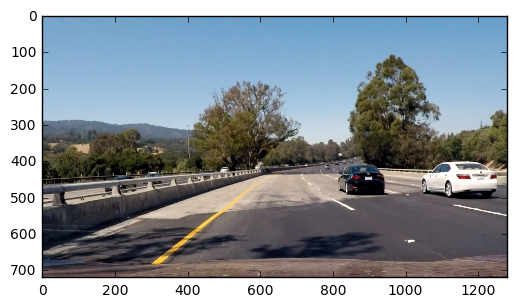

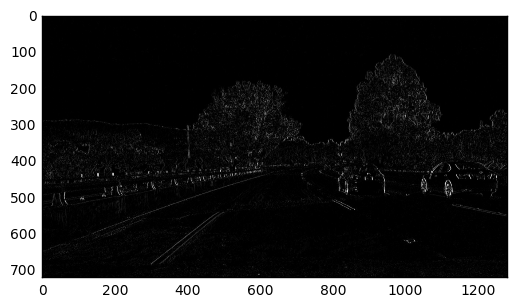

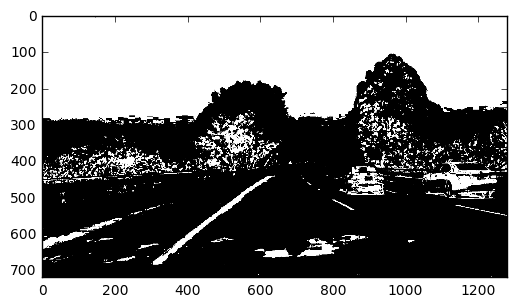

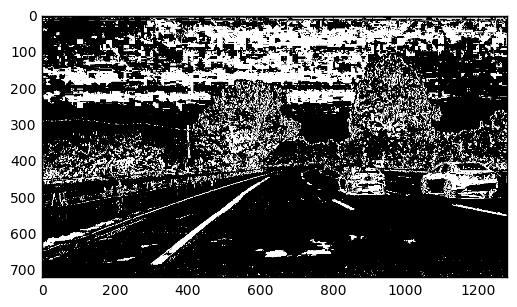

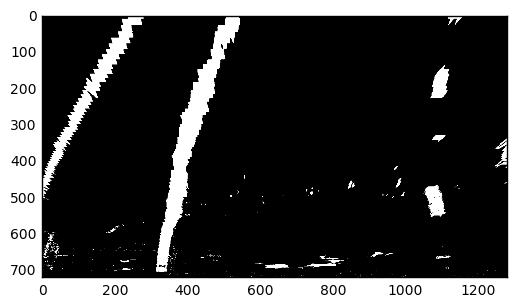

In [49]:
"""
Test create_binary_img algorithm
"""
img = mpimg.imread("test_images/test4.jpg")

# Resize all images for consistency
img = cv2.resize(img, (1280,720))

# Display original image
plt.imshow(img)
plt.show()

# Display Sobel-x (grayscale)
sobelxImg = sobelx(img)
plt.imshow(sobelxImg,cmap='gray')
plt.show()

# Display output of HLS img
hlsImg = hlsSelect(img, thresholds['hls'])
plt.imshow(hlsImg, cmap='gray')
plt.show()

#Display oriented gradient
# dirImg = dir_threshold(img, sobel_kernel=15, thresh=(-0.3,0.3)) #1.2))
# plt.imshow(dirImg,cmap='gray')
# plt.show()

# Display Merged Binary
#binImg = create_binary_img(img, thresholds)
#plt.imshow(binImg,cmap='gray')
#plt.show()

udBinImg = udacity_binary_img(img)
plt.imshow(udBinImg,cmap='gray')
plt.show()

M = get_perspective_transform([720, 1280])
warped = transform_perspective(udBinImg, M, (1280,720))# udBinImg.shape[::-1])
plt.imshow(warped,cmap='gray')
plt.show()

In [47]:
"""
Obtain the perspective transformation matrix given the source and destination points
"""
def get_perspective_transform(imgShape):
    M = cv2.getPerspectiveTransform(warpSrcPoints, warpDstPoints)
    return M

In [48]:
"""
Perform image warping to convert image to/from bird's eye view.
"""
def transform_perspective(img, M, dest_img_size):
    # Transform image to birds-eye-view
    warped = cv2.warpPerspective(img, M, dest_img_size)
    return warped

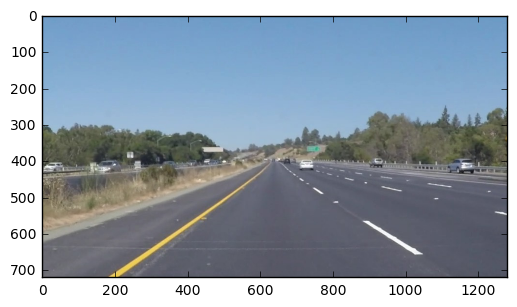

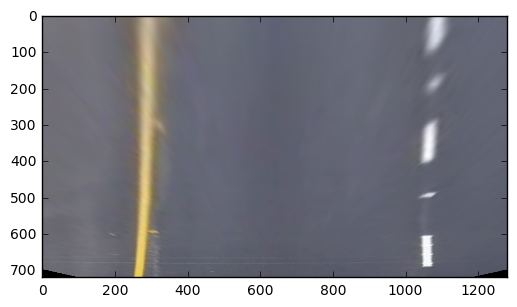

In [51]:
img = mpimg.imread('test_images/solidYellowLeft.jpg')

# Resize image for consistency
img = cv2.resize(img, (1280,720))

warped = transform_perspective(img, M, (1280, 720))
plt.imshow(img)
plt.show()
plt.imshow(warped)
plt.show()

In [183]:
"""
Function to compute lane curvature in real-space, where the output is 
reported in meters, using the empirical conversion provided by Udacity.
This algorithm is re-used from the lecture material.
"""
def computeLaneCurvature(left, right, Debug=False):
    # Define conversions in x and y from pixels space to meters
    
    # Fit a quadratic polynomial to the left and right images.
    leftFit = np.polyfit(left[1]*ym_per_pix, left[0]*xm_per_pix, 2)
    rightFit = np.polyfit(right[1]*ym_per_pix, right[0]*xm_per_pix, 2)
    
    # Define the point about which the radius of curvature is defined.
    y_eval = np.max(left[1])
    
    left_curve_radius = ((1 + (2*leftFit[0]*y_eval + leftFit[1])**2)**1.5) \
                                 /np.absolute(2*leftFit[0])
    right_curve_radius = ((1 + (2*rightFit[0]*y_eval + rightFit[1])**2)**1.5) \
                                    /np.absolute(2*rightFit[0])
    
    if Debug:
        print(left_curve_radius, 'm', right_curve_radius, 'm')
    return [[left_curve_radius, right_curve_radius], [leftFit, rightFit]]
    
"""
Function to compute lane curvature in pixel-space, where the output is 
reported in pixels. This algorithm is re-used from the lecture material.
"""
def computeLaneCurvaturePx(left, right, Debug=False):

    leftFit = np.polyfit(left[1], left[0], 2)
    rightFit = np.polyfit(right[1], right[0], 2)
    
    y_eval = np.max(left[1])
    
    left_curve_radius = ((1 + (2*leftFit[0]*y_eval + leftFit[1])**2)**1.5) \
                                 /np.absolute(2*leftFit[0])
    right_curve_radius = ((1 + (2*rightFit[0]*y_eval + rightFit[1])**2)**1.5) \
                                    /np.absolute(2*rightFit[0])
    
    if Debug:
        print(left_curve_radius, 'px', right_curve_radius, 'px')
    return [[left_curve_radius, right_curve_radius], [leftFit, rightFit]]

In [162]:
"""
Function to compute position error.  This is done by simply measuring the lane 
width between the detected lanes at the point nearest to the camera.
Then, this computed lane center is compared to half the width of the image.
The difference between the computed lane center to the image width/2 is the 
position error.
"""
def computePositionError(left, right, imgWidth, Debug=False):
    
    xLaneCenter = (right[0][0] + left[0][0]) / 2
    
    if Debug:
        print("ImgWidth = %d" % (imgWidth))
        print("X-Lane Center = %d px" % (xLaneCenter))
    
    # Compute the difference between the computed lane center and the center of image.
    positionErrorPx = xLaneCenter - imgWidth/2
    
    # Convert the pixel difference into real-space (meters)
    posError = positionErrorPx * xm_per_pix
    return posError, positionErrorPx


In [111]:
"""
Unwarps a bird's eye view image the road.
"""
def unwarpImg(img):
    # Get the matrix transformation from the warped space to unwarped space. 
    M_unwarp = cv2.getPerspectiveTransform(warpDstPoints, warpSrcPoints)
    
    # Unwarp the image.
    unwarpedImg = transform_perspective(img, M_unwarp, (img.shape[1], img.shape[0]))
    return unwarpedImg

"""
Generates the lane overlay to superimpose on the original image. 
"""
def makeOverlay(imgShape, leftLane, rightLane, posError, Debug=False):
    
    # Initialize with black screen.
    overlay = np.zeros((imgShape[0], imgShape[1], 3), dtype=np.uint8)
    
    if Debug:
        print("--Make Overlay--")
        print("Left-Lane:")
        print(leftLane)
        print("Right-Lane:")
        print(rightLane[::-1])
    
    # Convert these coordinates to numpy arrays.
    left = []
    right = []
    for i in range(len(leftLane[0])):
        left.append([leftLane[0][i],leftLane[1][i]])
        right.append([rightLane[0][i],rightLane[1][i]])
    left = np.asarray(left)
    right = np.asarray(right)
    
    # Create set of polygon vertices.  The order is left, then reversed(right).
    polygon = np.int32(np.concatenate((left, right[::-1]),axis=0))
    
    # Draw the lane with a green color.
    cv2.fillPoly(overlay, np.int32([polygon]), (0, 255, 0))

    if Debug:
        plt.imshow(overlay,cmap='gray')
        plt.show()

    return overlay
    

# Executive Pipeline Function
The function below assembles all the functions into a sequence of execution to 
identify the left and right lane lines.

In [182]:
"""
This is the MAIN pipeline for processing an image.
"""
def processImg(img, mtx, dist, M, thresholds, Debug=False):
    
    # Undistort the image
    undistortedImg = undistort_img(img, mtx, dist)

    # Apply thresholding (color transforms, gradients) to obtain binary image
    thresholded = udacity_binary_img(undistortedImg, Debug)
    
    # Warp the image with a perspective transform into the bird's eye view (top-down)
    birdsEyeView = transform_perspective(thresholded, M, (thresholded.shape[1], thresholded.shape[0]))

    # Identify the lane pixels in the bird's eye view image
    lanes = findLanePixels(birdsEyeView, Debug)

    left = lanes[0]
    right = lanes[1]
    leftLane.savePoints(left[:,0],left[:,1])
    rightLane.savePoints(right[:,0],right[:,1])
    
    # Obtain a filtered lane solution from left and right lane instances of Line
    leftCurve = leftLane.getFilteredLine()
    rightCurve = rightLane.getFilteredLine()
    
    if Debug:    
        plt.plot(leftCurve[0], leftCurve[1],'--r',linewidth=2)
        plt.plot(left[:,0],left[:,1],'r.')
        plt.plot(rightCurve[0], rightCurve[1],'--g',linewidth=2)
        plt.plot(right[:,0],right[:,1],'g.')
        plt.gca().invert_yaxis()
        plt.xlim((0,1280))
        plt.show()
    
    # Compute the position error (off centerline)
    posError, posErrorPx = computePositionError(leftCurve, rightCurve, birdsEyeView.shape[1])
    
    # Compute the lane curvature in real-space and in pixel space.
    outputM  = computeLaneCurvature(leftCurve, rightCurve, Debug)
    outputPx = computeLaneCurvaturePx(leftCurve, rightCurve, Debug)
    
    # Store the real-space curvature for later display
    curvature = outputM[0]
    
    # Generate overlay to superimpose on the image.
    overlay = makeOverlay(birdsEyeView.shape, leftCurve, rightCurve, posError, Debug)
    
    # Warp the overlay from bird's eye view into the original view.
    unwarpedOverlay = unwarpImg(overlay)
    
    # Combine the overlay with the original image.
    origImgWithOverlay = cv2.addWeighted(undistortedImg, 1.0, unwarpedOverlay, 0.2, 0)
    
    # Draw text on the screen (in unwarped image space).  Show position error and left/right curvature values.
    font = cv2.FONT_HERSHEY_SIMPLEX
    posErrorString = "Pos Error = %6.2f m" % (posError)
    cv2.putText(origImgWithOverlay, posErrorString,(50,50), font, 1, (255,255,255),2)
    
    leftLaneCurvStr = "Left Curv = %6.2f m" % (curvature[0])
    rightLaneCurvStr = "Right Curv = %6.2f m" % (curvature[1])
    cv2.putText(origImgWithOverlay, leftLaneCurvStr,(50,100), font, 1, (255,255,255),2)
    cv2.putText(origImgWithOverlay, rightLaneCurvStr,(50,150), font, 1, (255,255,255),2)
    

    # If in Debug mode, create a series of plots to visualize intermediate processing
    # outputs.  This aids in troubleshooting issues in the pipeline.
    if Debug:
        plt.imshow(origImgWithOverlay)
        plt.show()

        # Plot results
        f, (ax1, ax2, ax3) = plt.subplots(1,3,figsize=(15,9))
        f.tight_layout()
        ax1.imshow(img)
        for i in range(len(warpSrcPoints)):
            ax1.plot(warpSrcPoints[i][0], warpSrcPoints[i][1],'.')

        ax1.set_title('Original Image',fontsize=50)
        ax2.imshow(thresholded, cmap='gray')
        ax2.set_title('Thresholded', fontsize=50)
        ax3.imshow(birdsEyeView, cmap='gray')
        for i in range(len(warpSrcPoints)):
            ax3.plot(warpDstPoints[i][0], warpDstPoints[i][1],'.')
        ax3.set_title('Birds Eye View', fontsize=50)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
        for i in range(len(lanes)):
            for j in range(2):
                ax3.plot(lanes[i][j][0], lanes[i][j][1],'s')
        plt.show()
    
    return origImgWithOverlay

# Line class

In the block below, I define a `Line` class based on the Udacity-provided class.  The class will fit a curve to the median of the previous *N* sets of lane keypoints. 

Printing curve:
[ 973.62242792  973.35685902  973.21583447  973.19935429  973.30741846
  973.540027    973.89717989  974.37887715  974.98511876  975.71590474
  976.57123507  977.55110976  978.65552881  979.88449223  981.238
  982.71605213  984.31864862  986.04578947  987.89747468  989.87370425]


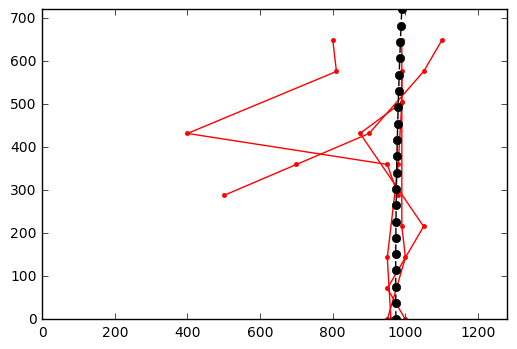

In [171]:
# Line Class
class Line():
    def __init__(self, imgHeight, Debug=False):
        self.points = []
        self.fitLine = []
        self.N = 10 # Number of past instances to keep
        self.imgHeight = imgHeight
        self.numVertices = 20
        self.y = np.linspace(0,imgHeight, self.numVertices)
        self.Debug = Debug
    
    """Record the last set of detected keypoints"""
    def savePoints(self, x, y):
        # Add the most recent set of points
        self.points.append((x,y))
        
        # Compute the fit
        rawFit = self.fit(x, y)

        # Generate curve
        y = np.linspace(0,self.imgHeight,self.numVertices)
        # Generate the curves for the quadratic fits for the left and right lanes.
        self.fitLine.append(self.interpPoly(rawFit, y))
        
        # If we have too much stored data, then pop off the oldest sample.
        if len(self.points) > self.N:
            # Pop the oldest set of points
            self.points.pop(0)
            self.fitLine.pop(0)
    
    """Fit 2nd-order polynomial to data"""
    def fit(self, x, y):
        thisFit = np.polyfit(y, x, 2)
        return thisFit
    
    """ Generate curve based on polynomial fit coefficients"""
    def interpPoly(self, fit, y):
        return fit[0]*y**2 + fit[1]*y + fit[2]
        
    def getFilteredLine(self):
        # For each stored set of points (curve)
        avg = []
        # For each vertex
        
        # For each vertex
        for i in range(self.numVertices):
            
            # Collect all points for this slot from each curve.
            
            slot = []
            
            # For each curve
            for curve in self.fitLine:
                # Append the ith point from the curve into the slot
                if self.Debug:
                    print("CURVE")
                    print(curve)
                    plt.plot(curve[i],self.y[i],'k.')
                slot.append(curve[i])
                
            
            m = np.median(slot)
            avg.append(m)
            if self.Debug:
                plt.plot(m,self.y[i],'rs')
                
            
        
        # Convert avg to numpy array
        npAvg = np.asarray(avg)
        
        if self.Debug:
            print(npAvg)
        
        # Fit polynomial
        avgFit = self.fit(np.asarray(avg), self.y)
        
        avgLine = self.interpPoly(avgFit, self.y)
        if self.Debug:
            plt.plot(avgLine, self.y,'--r')
            plt.xlim([0, 1280])
            plt.show()
        
        return (avgLine, self.y)
            
            
            
def TestLine():
    # Define how to use.
    leftLane = Line(720)
    rightLane = Line(720)

    pts1 = np.asarray([[950, 0], [975, 72],[1000,72*2],[990, 72*3],[990,72*8]])
    pts2 = np.asarray([[960, 0], [950, 72*2],[980,72*5],[990, 72*7],[990,72*9]])
    pts3 = np.asarray([[980, 72*4], [950, 72*5],[400,72*6],[810, 72*8],[800,72*9]])
    pts4 = np.asarray([[1000, 0], [950, 72*1],[1050,72*3],[875, 72*6],[990,72*7]])
    pts5 = np.asarray([[500, 72*4], [700, 72*5],[900,72*6],[1050, 72*8],[1100,72*9]])
    

    leftLane.savePoints(pts1[:,0], pts1[:,1])
    leftLane.savePoints(pts2[:,0], pts2[:,1])
    leftLane.savePoints(pts3[:,0], pts3[:,1])
    leftLane.savePoints(pts4[:,0], pts4[:,1])
    leftLane.savePoints(pts5[:,0], pts5[:,1])
    
    curve = leftLane.getFilteredLine()

    print("Printing curve:")
    print(curve[0])
    
    plt.plot(pts1[:,0],pts1[:,1],'.r-')
    plt.plot(pts2[:,0],pts2[:,1],'.r-')
    plt.plot(pts3[:,0],pts3[:,1],'.r-')
    plt.plot(pts4[:,0],pts4[:,1],'.r-')
    plt.plot(pts5[:,0],pts5[:,1],'.r-')
    plt.plot(curve[0], curve[1],'ok--')
    plt.ylim([0, 720])
    plt.xlim([0, 1280])
    plt.show()
    # leftLane.savePoints()
    # rightLane.save(rightPoints)

    # leftLane.getFilteredLine()
TestLine()

# Lane Pixel Identification
The code below `findLanePixels()` identifies a series of points from the binary images that are used to fit a polynomial. 

In [157]:
"""
Identify points along the detected lane pixels to be used in fitting polynomials.
"""
def findLanePixels(img, Debug=False):
    
    # Coarse peak identification: Compute a histogram of the lower half of the image.
    histogram = np.sum(img[int(img.shape[0]/2):,:], axis=0)

    # Identify the peak points in the histogram in the left and 
    # right point halves of the histogram.
    xSplit = len(histogram)/2
    leftPeak = np.argmax(histogram[:xSplit])
    rightPeak = np.argmax(histogram[xSplit:])+xSplit
    
    # If in Debug mode, print the coarse solution.
    if Debug:
        print("----- COARSE -------")
        print("Left peak is at %d" % (leftPeak))
        print("Right peak is at %d" % (rightPeak))
    
    # Define the search window for subsequent pixels.
    windowWidth = img.shape[1] / 5

    # Divide the image into horizontal stripes to search.
    yBins = np.linspace(img.shape[0], 0, numYBins)

    # If in Debug mode, show the binary image in top-down view.
    if Debug:
        print("------ FINE --------")
        plt.imshow(img,cmap='gray')
    
    # Initialize the arrays that will store the lane points.
    windowPeak = []
    leftLaneMarker = []
    rightLaneMarker = []
    
    # For each horizontal stripe in the image
    for i in range(numYBins-1):

        # Define y-bounds for search window
        yMax = yBins[i+1]
        yMin = yBins[i]

        ######
        # Perform search for left lane pixels
        ######
        xMin = max([leftPeak - windowWidth/2, 0])
        xMax = xMin + windowWidth
        
        # Compute the histogram of the smaller search window.
        hist = np.sum(img[yMax:yMin,xMin:xMax],axis=0)
        
        # If in Debug mode, plot the search window as a red square.
        if Debug:
            plt.plot([xMin, xMax, xMax, xMin, xMin], 
                     [yMax, yMax, yMin, yMin, yMax],'-rs')
            
        # Count the number of activated pixels in the search window
        leftHits = sum(hist)
        
        # If there are enough hits to register a real lane marker
        if (leftHits > sufficientHits): # or len(leftLaneMarker)==0:
            # Then identify the candidate peak x-coordinate.
            candidatePeak = np.argmax(hist) + xMin
            
            # Measure how far separated the proposed candidate pixel 
            # is from the previous point.
            dx = candidatePeak - leftPeak
            
            if Debug:
                print("RIGHT: Proposed moving %d px" % (dx))
            
            # If the proposed move is more than 75 pixels away, then 
            # constrain the update to just 75 pixels.
            if abs(dx) > 75:
                leftPeak = leftPeak + np.sign(dx)*75
            else:
                # Otherwise, do not constrain the update.
                leftPeak = candidatePeak
            
            # Store the left peak X and Y coordinates.
            leftLaneMarker.append([leftPeak, (yMax+yMin)/2.0])
        else:
            # No, there weren't enough lane pixels activated within the search window.
            # This suggests that:
            #  1) there either isn't a lane marker in this stripe, OR
            #  2) the algorithm has lost track of the lane.
            
            # I attempted to implement clever fall-back code, but it typically caused
            # more trouble than it was worth.  As a result, I just keep the previous
            # leftPeak value and duplicate it.

            if Debug:
                print("LEFT: Failed to re-detect lane.  Output stale X.")
            leftLaneMarker.append([leftPeak, (yMax+yMin)/2])
            
            
        # If in Debug mode, plot the solution point with a yellow dot.
        if Debug:
            plt.plot(leftPeak, (yMax+yMin)/2,'yo')
        
        ########
        # Right lane finding algorithm (duplicate of left with minor changes)
        ########
        
        # Form the x-bounds of the right lane search window
        xMax = min([rightPeak + windowWidth/2, img.shape[1]])
        xMin = xMax - windowWidth
        
        # If in Debug mode, plot the search window
        if Debug:
            plt.plot([xMin, xMax, xMax, xMin, xMin], 
                     [yMax, yMax, yMin, yMin, yMax],'-rs')
        
        
        # Compute the histogram of the right search window.
        hist = np.sum(img[yMax:yMin, xMin:xMax], axis=0)
        
        # Count the number of activated pixels within the search window.
        rightHits = sum(hist)
        
        # If the number of activated pixels within the search window exceeds a threshold
        if (rightHits > sufficientHits):
            # Then performed a constrained update to the right peak (<=75px updates permitted)
            candidatePeak = np.argmax(hist) + xMin
            dx = candidatePeak - rightPeak
            if Debug:
                print("RIGHT: Proposed moving %d px" % (dx))
            if abs(dx) > 75:
                rightPeak = rightPeak + np.sign(dx)*75
            else:
                rightPeak = candidatePeak
            
            rightLaneMarker.append([rightPeak, (yMax+yMin)/2])
        else:
            if Debug:
                print("RIGHT: Failed to re-detect lane.  Output stale X.")
            rightLaneMarker.append([rightPeak, (yMax+yMin)/2])

        if Debug:
            plt.plot(rightPeak, (yMax+yMin)/2,'yo')
        
        if Debug:
            print("-- Box %d --" % (i))
            print("Left X = %d (%d hits)" % (leftPeak, leftHits))
            print("Right X = %d (%d hits)" % (rightPeak, rightHits))
        
        
        
    # Convert from lists to np arrays
    rightLaneMarker = np.asarray(rightLaneMarker)
    leftLaneMarker  = np.asarray(leftLaneMarker)
    plt.show()
    
    if Debug:
        print(leftLaneMarker)
        print(rightLaneMarker)
        
    return [leftLaneMarker, rightLaneMarker]

The cell below is where I test the pipeline on various image frames extracted from the video.

In [58]:
"""
Here is my test function to process a single image.  
"""

def test(testImg, Debug=False):
    img = mpimg.imread(testImg)

    mtx, dist, M = setup()
    
    # Resize all images for consistency
    img = cv2.resize(img, (1280,720))
    if Debug:
        print(img.shape)
            
    # Process image using pipeline 
    imgOut = processImg(img, mtx, dist, M, thresholds, Debug)
    plt.imshow(imgOut)
    plt.show()

------ Frame 10 --------
(720, 1280, 3)


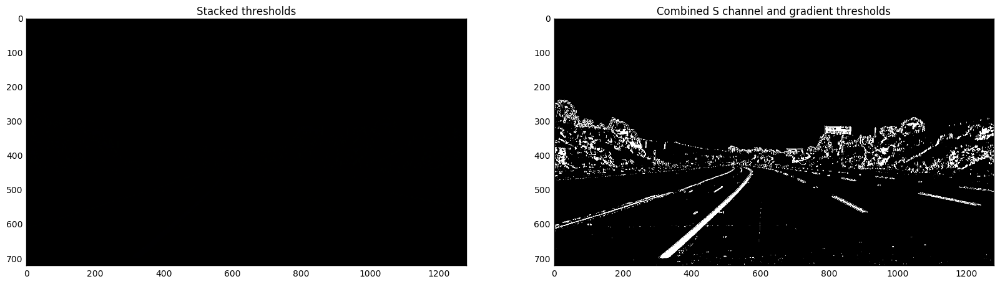

----- COARSE -------
Left peak is at 349
Right peak is at 1076
------ FINE --------
RIGHT: Proposed moving -6 px
RIGHT: Failed to re-detect lane.  Output stale X.
-- Box 0 --
Left X = 343 (2336 hits)
Right X = 1076 (21 hits)
RIGHT: Proposed moving 4 px
RIGHT: Proposed moving -1 px
-- Box 1 --
Left X = 347 (2909 hits)
Right X = 1075 (1307 hits)
RIGHT: Proposed moving 0 px
RIGHT: Proposed moving -9 px
-- Box 2 --
Left X = 347 (2861 hits)
Right X = 1066 (1642 hits)
RIGHT: Proposed moving 2 px
RIGHT: Failed to re-detect lane.  Output stale X.
-- Box 3 --
Left X = 349 (2739 hits)
Right X = 1066 (488 hits)
RIGHT: Proposed moving -8 px
RIGHT: Failed to re-detect lane.  Output stale X.
-- Box 4 --
Left X = 341 (3660 hits)
Right X = 1066 (439 hits)
RIGHT: Proposed moving -9 px
RIGHT: Proposed moving -96 px
-- Box 5 --
Left X = 332 (3283 hits)
Right X = 991 (2494 hits)
RIGHT: Proposed moving -15 px
RIGHT: Proposed moving -73 px
-- Box 6 --
Left X = 317 (2948 hits)
Right X = 918 (1113 hits)
RIGHT

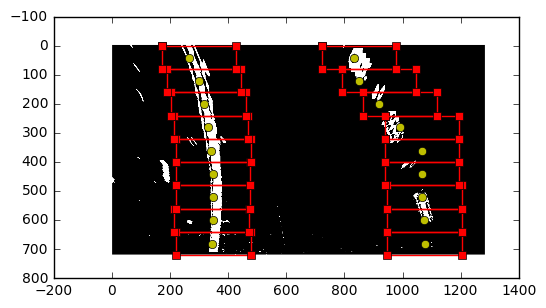

[[ 343.  680.]
 [ 347.  600.]
 [ 347.  520.]
 [ 349.  440.]
 [ 341.  360.]
 [ 332.  280.]
 [ 317.  200.]
 [ 300.  120.]
 [ 265.   40.]]
[[ 1076.   680.]
 [ 1075.   600.]
 [ 1066.   520.]
 [ 1066.   440.]
 [ 1066.   360.]
 [  991.   280.]
 [  918.   200.]
 [  850.   120.]
 [  834.    40.]]


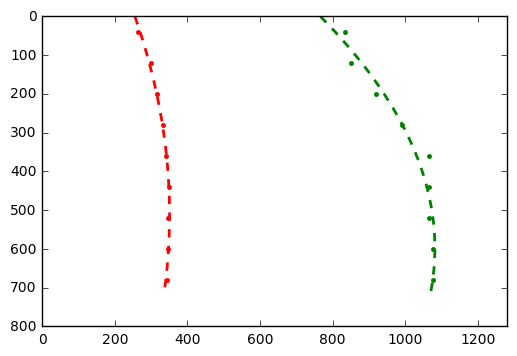

2831.344862 m 10710.6312255 m
1419.28300265 px 607.51736039 px
--Make Overlay--
Left-Lane:
(array([ 255.33333333,  268.94136657,  281.5023084 ,  293.01615882,
        303.48291782,  312.90258541,  321.27516159,  328.60064635,
        334.8790397 ,  340.11034164,  344.29455217,  347.43167128,
        349.52169898,  350.56463527,  350.56048015,  349.50923361,
        347.41089566,  344.2654663 ,  340.07294552,  334.83333333]), array([   0.        ,   37.89473684,   75.78947368,  113.68421053,
        151.57894737,  189.47368421,  227.36842105,  265.26315789,
        303.15789474,  341.05263158,  378.94736842,  416.84210526,
        454.73684211,  492.63157895,  530.52631579,  568.42105263,
        606.31578947,  644.21052632,  682.10526316,  720.        ]))
Right-Lane:
(array([   0.        ,   37.89473684,   75.78947368,  113.68421053,
        151.57894737,  189.47368421,  227.36842105,  265.26315789,
        303.15789474,  341.05263158,  378.94736842,  416.84210526,
        454.73684211

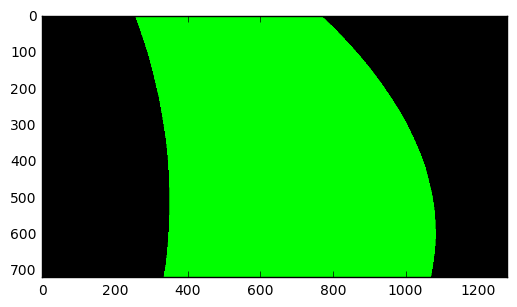

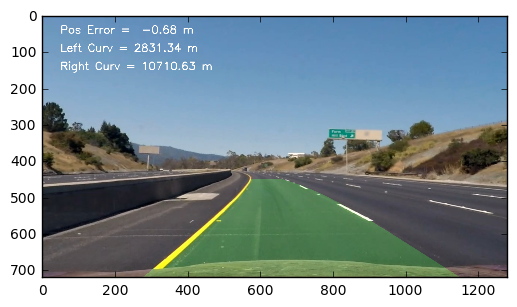

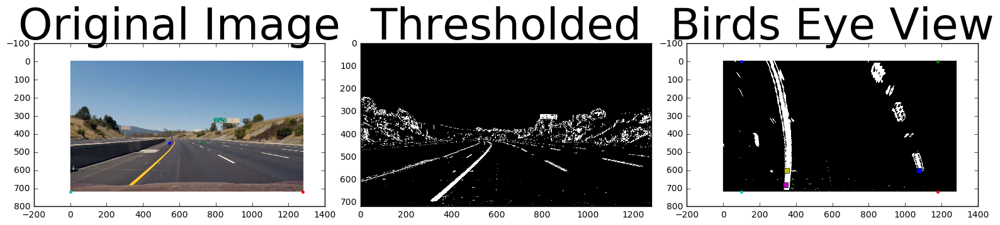

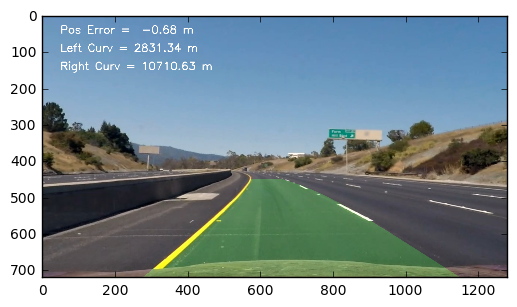

------ Frame 12 --------
(720, 1280, 3)


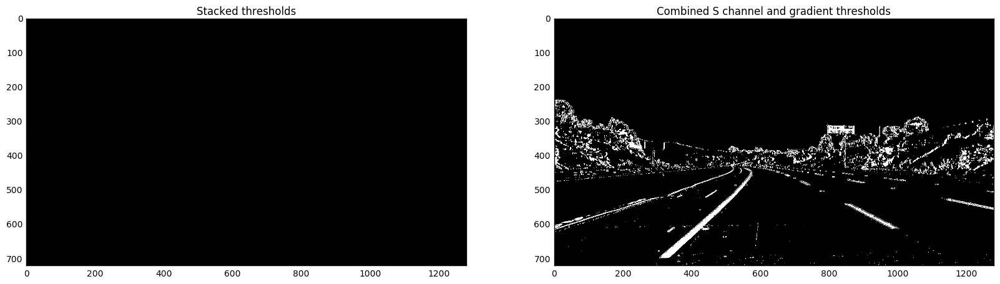

----- COARSE -------
Left peak is at 351
Right peak is at 1077
------ FINE --------
RIGHT: Proposed moving -7 px
RIGHT: Proposed moving 18 px
-- Box 0 --
Left X = 344 (2577 hits)
Right X = 1095 (537 hits)
RIGHT: Proposed moving 3 px
RIGHT: Proposed moving -18 px
-- Box 1 --
Left X = 347 (2674 hits)
Right X = 1077 (2203 hits)
RIGHT: Proposed moving 4 px
RIGHT: Failed to re-detect lane.  Output stale X.
-- Box 2 --
Left X = 351 (2772 hits)
Right X = 1077 (3 hits)
RIGHT: Proposed moving -2 px
RIGHT: Failed to re-detect lane.  Output stale X.
-- Box 3 --
Left X = 349 (2897 hits)
Right X = 1077 (382 hits)
RIGHT: Proposed moving -8 px
RIGHT: Proposed moving -90 px
-- Box 4 --
Left X = 341 (3576 hits)
Right X = 1002 (1964 hits)
RIGHT: Proposed moving -13 px
RIGHT: Proposed moving -43 px
-- Box 5 --
Left X = 328 (3173 hits)
Right X = 959 (1083 hits)
RIGHT: Proposed moving -7 px
RIGHT: Proposed moving -38 px
-- Box 6 --
Left X = 321 (2931 hits)
Right X = 921 (1292 hits)
RIGHT: Proposed moving -

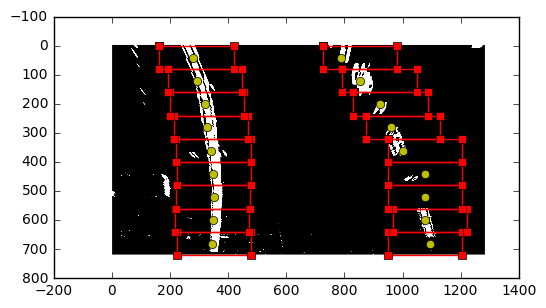

[[ 344.  680.]
 [ 347.  600.]
 [ 351.  520.]
 [ 349.  440.]
 [ 341.  360.]
 [ 328.  280.]
 [ 321.  200.]
 [ 291.  120.]
 [ 279.   40.]]
[[ 1095.   680.]
 [ 1077.   600.]
 [ 1077.   520.]
 [ 1077.   440.]
 [ 1002.   360.]
 [  959.   280.]
 [  921.   200.]
 [  854.   120.]
 [  787.    40.]]


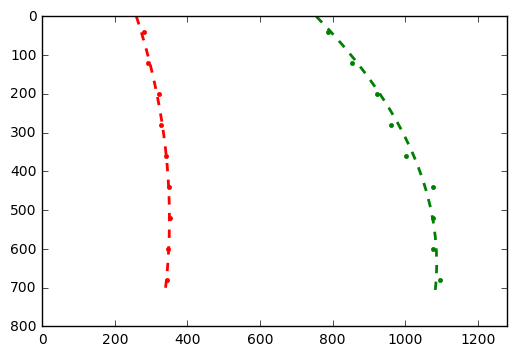

2576.6826383 m 9255.84031164 m
1536.19976874 px 630.654942937 px
--Make Overlay--
Left-Lane:
(array([ 259.32984307,  272.06602054,  283.84276893,  294.66008824,
        304.51797848,  313.41643965,  321.35547174,  328.33507475,
        334.35524869,  339.41599356,  343.51730935,  346.65919606,
        348.8416537 ,  350.06468226,  350.32828175,  349.63245217,
        347.97719351,  345.36250577,  341.78838896,  337.25484307]), array([   0.        ,   37.89473684,   75.78947368,  113.68421053,
        151.57894737,  189.47368421,  227.36842105,  265.26315789,
        303.15789474,  341.05263158,  378.94736842,  416.84210526,
        454.73684211,  492.63157895,  530.52631579,  568.42105263,
        606.31578947,  644.21052632,  682.10526316,  720.        ]))
Right-Lane:
(array([   0.        ,   37.89473684,   75.78947368,  113.68421053,
        151.57894737,  189.47368421,  227.36842105,  265.26315789,
        303.15789474,  341.05263158,  378.94736842,  416.84210526,
        454.736842

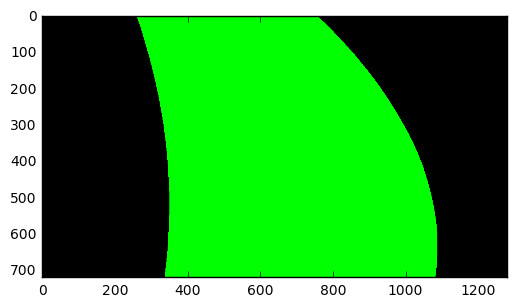

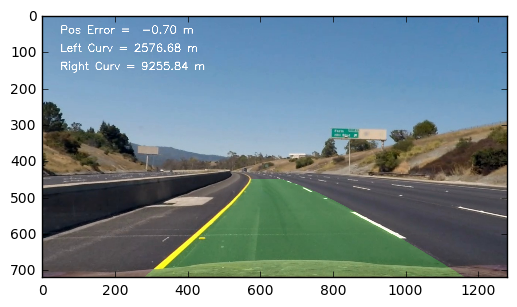

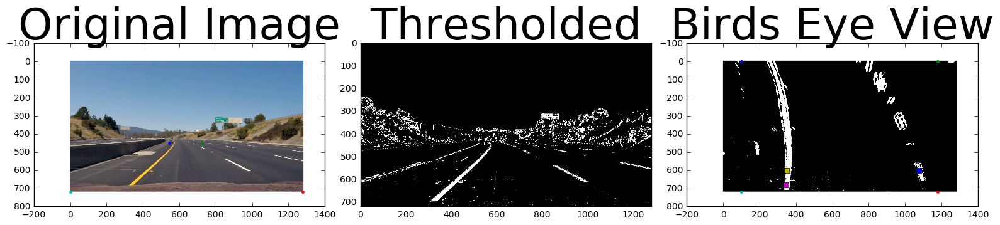

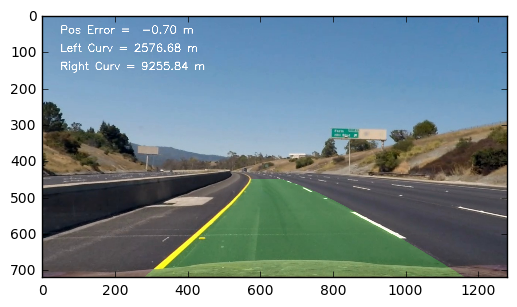

------ Frame 14 --------
(720, 1280, 3)


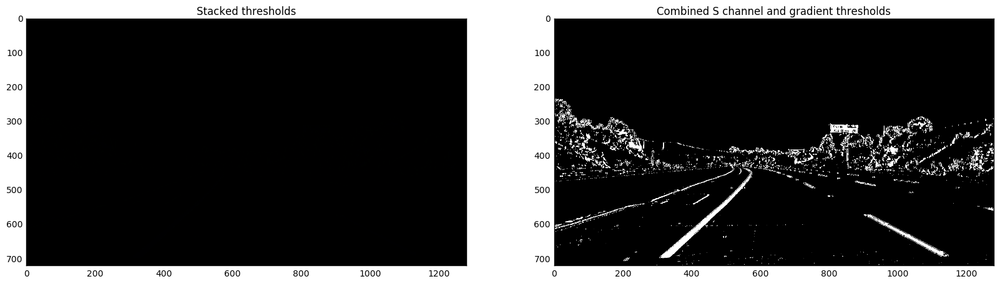

----- COARSE -------
Left peak is at 350
Right peak is at 1088
------ FINE --------
RIGHT: Proposed moving -7 px
RIGHT: Proposed moving 3 px
-- Box 0 --
Left X = 343 (2344 hits)
Right X = 1091 (1767 hits)
RIGHT: Proposed moving 7 px
RIGHT: Proposed moving -14 px
-- Box 1 --
Left X = 350 (2618 hits)
Right X = 1077 (677 hits)
RIGHT: Proposed moving 0 px
RIGHT: Failed to re-detect lane.  Output stale X.
-- Box 2 --
Left X = 350 (2677 hits)
Right X = 1077 (253 hits)
RIGHT: Proposed moving -2 px
RIGHT: Proposed moving -79 px
-- Box 3 --
Left X = 348 (3480 hits)
Right X = 1002 (745 hits)
RIGHT: Proposed moving -7 px
RIGHT: Proposed moving -15 px
-- Box 4 --
Left X = 341 (3092 hits)
Right X = 987 (2179 hits)
RIGHT: Proposed moving -9 px
RIGHT: Proposed moving -65 px
-- Box 5 --
Left X = 332 (3367 hits)
Right X = 922 (903 hits)
RIGHT: Proposed moving -11 px
RIGHT: Proposed moving -61 px
-- Box 6 --
Left X = 321 (3286 hits)
Right X = 861 (2474 hits)
RIGHT: Proposed moving -30 px
RIGHT: Proposed

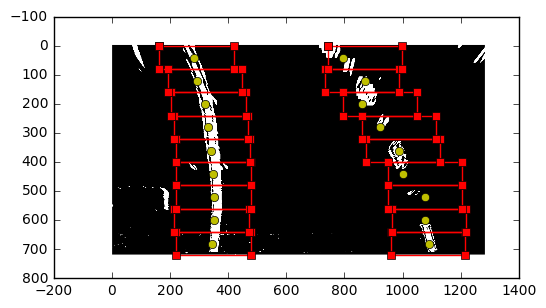

[[ 343.  680.]
 [ 350.  600.]
 [ 350.  520.]
 [ 348.  440.]
 [ 341.  360.]
 [ 332.  280.]
 [ 321.  200.]
 [ 291.  120.]
 [ 281.   40.]]
[[ 1091.   680.]
 [ 1077.   600.]
 [ 1077.   520.]
 [ 1002.   440.]
 [  987.   360.]
 [  922.   280.]
 [  861.   200.]
 [  870.   120.]
 [  795.    40.]]


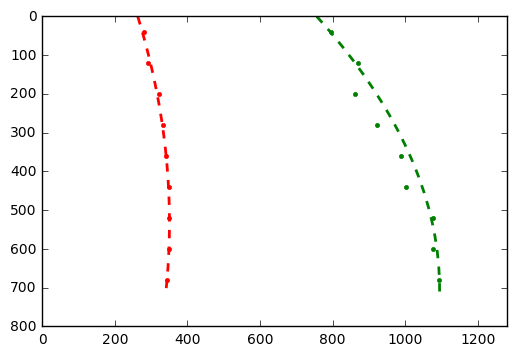

2383.85083984 m 6711.52243446 m
1655.03577527 px 735.907829326 px
--Make Overlay--
Left-Lane:
(array([ 263.12257238,  275.11048976,  286.21323864,  296.43081904,
        305.76323095,  314.21047438,  321.77254931,  328.44945575,
        334.24119371,  339.14776318,  343.16916416,  346.30539665,
        348.55646065,  349.92235617,  350.40308319,  349.99864173,
        348.70903178,  346.53425334,  343.47430641,  339.529191  ]), array([   0.        ,   37.89473684,   75.78947368,  113.68421053,
        151.57894737,  189.47368421,  227.36842105,  265.26315789,
        303.15789474,  341.05263158,  378.94736842,  416.84210526,
        454.73684211,  492.63157895,  530.52631579,  568.42105263,
        606.31578947,  644.21052632,  682.10526316,  720.        ]))
Right-Lane:
(array([   0.        ,   37.89473684,   75.78947368,  113.68421053,
        151.57894737,  189.47368421,  227.36842105,  265.26315789,
        303.15789474,  341.05263158,  378.94736842,  416.84210526,
        454.73684

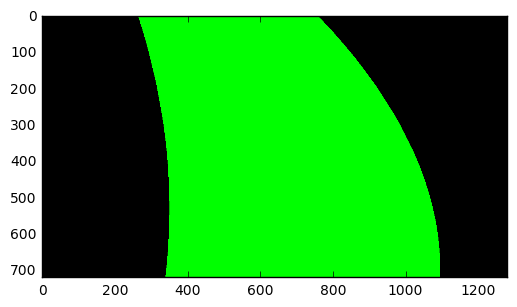

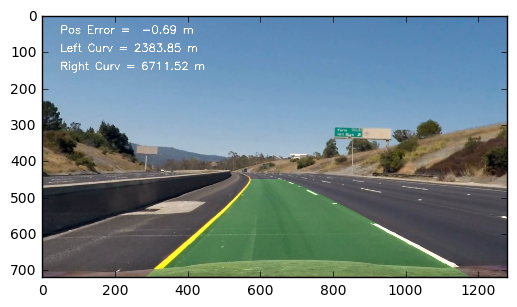

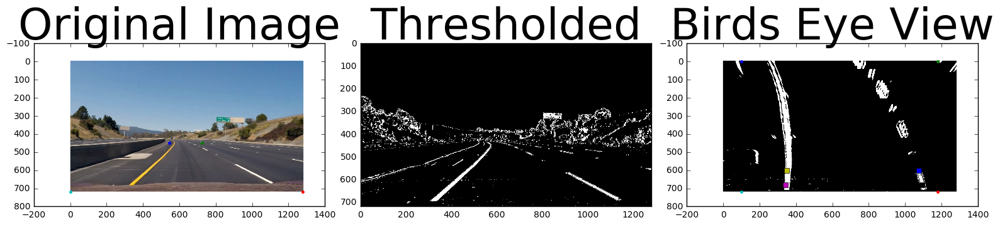

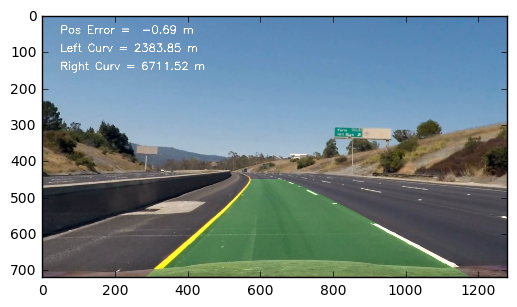

------ Frame 16 --------
(720, 1280, 3)


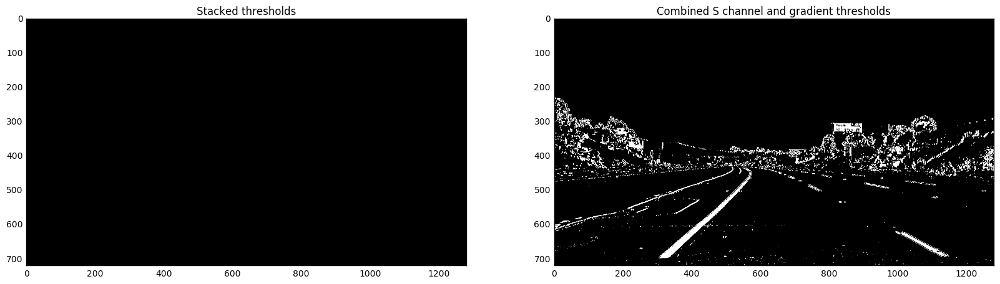

----- COARSE -------
Left peak is at 352
Right peak is at 1004
------ FINE --------
RIGHT: Proposed moving -8 px
RIGHT: Proposed moving 95 px
-- Box 0 --
Left X = 344 (2412 hits)
Right X = 1079 (1066 hits)
RIGHT: Proposed moving 2 px
RIGHT: Failed to re-detect lane.  Output stale X.
-- Box 1 --
Left X = 346 (2597 hits)
Right X = 1079 (1 hits)
RIGHT: Proposed moving 0 px
RIGHT: Failed to re-detect lane.  Output stale X.
-- Box 2 --
Left X = 346 (2830 hits)
Right X = 1079 (215 hits)
RIGHT: Proposed moving -2 px
RIGHT: Proposed moving -77 px
-- Box 3 --
Left X = 344 (3369 hits)
Right X = 1004 (1931 hits)
RIGHT: Proposed moving -9 px
RIGHT: Proposed moving 1 px
-- Box 4 --
Left X = 335 (3328 hits)
Right X = 1005 (809 hits)
RIGHT: Proposed moving -7 px
RIGHT: Proposed moving -57 px
-- Box 5 --
Left X = 328 (2788 hits)
Right X = 948 (780 hits)
RIGHT: Proposed moving -11 px
RIGHT: Proposed moving -54 px
-- Box 6 --
Left X = 317 (3053 hits)
Right X = 894 (3755 hits)
RIGHT: Proposed moving -14 

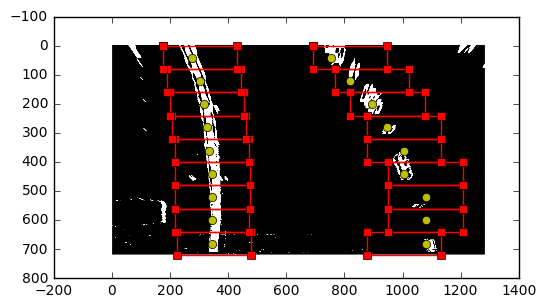

[[ 344.  680.]
 [ 346.  600.]
 [ 346.  520.]
 [ 344.  440.]
 [ 335.  360.]
 [ 328.  280.]
 [ 317.  200.]
 [ 303.  120.]
 [ 276.   40.]]
[[ 1079.   680.]
 [ 1079.   600.]
 [ 1079.   520.]
 [ 1004.   440.]
 [ 1005.   360.]
 [  948.   280.]
 [  894.   200.]
 [  819.   120.]
 [  755.    40.]]


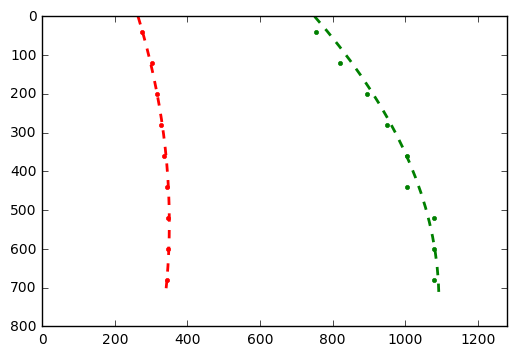

2352.15006465 m 5960.0911669 m
1679.10945935 px 788.459424355 px
--Make Overlay--
Left-Lane:
(array([ 263.92247495,  275.73803034,  286.68167915,  296.75342141,
        305.95325711,  314.28118625,  321.73720883,  328.32132484,
        334.0335343 ,  338.87383719,  342.84223352,  345.9387233 ,
        348.16330651,  349.51598316,  349.99675325,  349.60561678,
        348.34257375,  346.20762415,  343.200768  ,  339.32200529]), array([   0.        ,   37.89473684,   75.78947368,  113.68421053,
        151.57894737,  189.47368421,  227.36842105,  265.26315789,
        303.15789474,  341.05263158,  378.94736842,  416.84210526,
        454.73684211,  492.63157895,  530.52631579,  568.42105263,
        606.31578947,  644.21052632,  682.10526316,  720.        ]))
Right-Lane:
(array([   0.        ,   37.89473684,   75.78947368,  113.68421053,
        151.57894737,  189.47368421,  227.36842105,  265.26315789,
        303.15789474,  341.05263158,  378.94736842,  416.84210526,
        454.736842

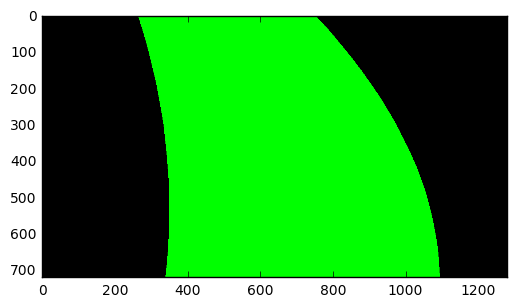

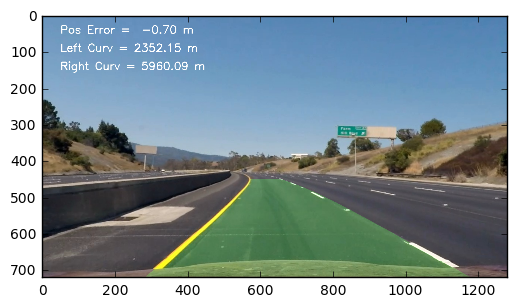

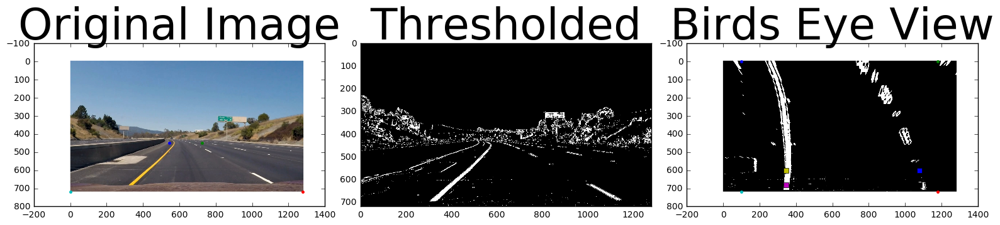

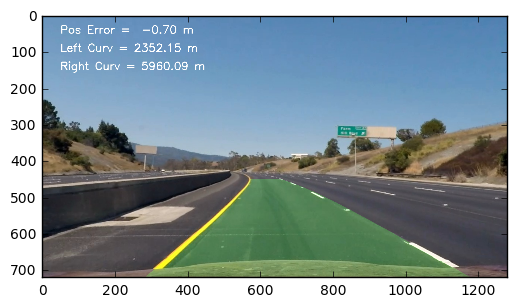

------ Frame 18 --------
(720, 1280, 3)


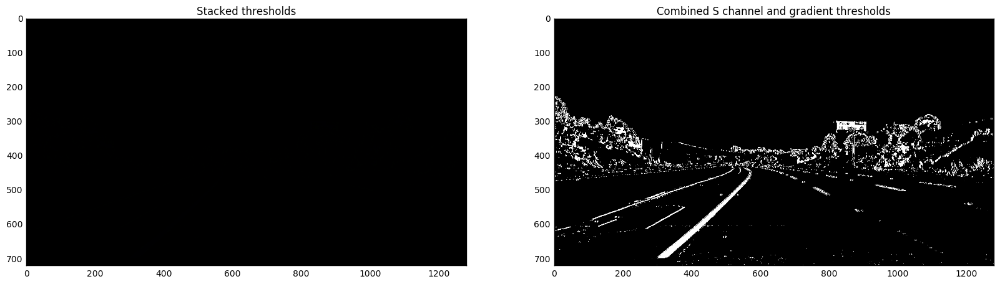

----- COARSE -------
Left peak is at 340
Right peak is at 1025
------ FINE --------
RIGHT: Proposed moving 0 px
RIGHT: Failed to re-detect lane.  Output stale X.
-- Box 0 --
Left X = 340 (2307 hits)
Right X = 1025 (70 hits)
RIGHT: Proposed moving 0 px
RIGHT: Failed to re-detect lane.  Output stale X.
-- Box 1 --
Left X = 340 (2659 hits)
Right X = 1025 (222 hits)
RIGHT: Proposed moving 0 px
RIGHT: Failed to re-detect lane.  Output stale X.
-- Box 2 --
Left X = 340 (3164 hits)
Right X = 1025 (457 hits)
RIGHT: Proposed moving -4 px
RIGHT: Proposed moving 0 px
-- Box 3 --
Left X = 336 (3092 hits)
Right X = 1025 (2370 hits)
RIGHT: Proposed moving -6 px
RIGHT: Failed to re-detect lane.  Output stale X.
-- Box 4 --
Left X = 330 (3384 hits)
Right X = 1025 (344 hits)
RIGHT: Proposed moving -7 px
RIGHT: Proposed moving -58 px
-- Box 5 --
Left X = 323 (3156 hits)
Right X = 967 (851 hits)
RIGHT: Proposed moving -8 px
RIGHT: Proposed moving -59 px
-- Box 6 --
Left X = 315 (2934 hits)
Right X = 908 

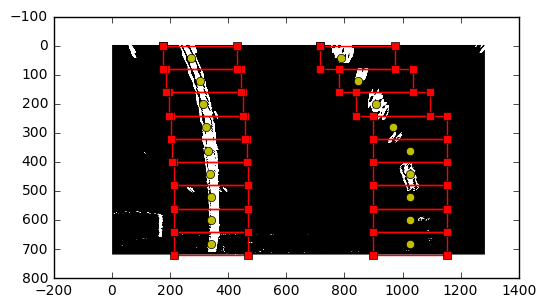

[[ 340.  680.]
 [ 340.  600.]
 [ 340.  520.]
 [ 336.  440.]
 [ 330.  360.]
 [ 323.  280.]
 [ 315.  200.]
 [ 304.  120.]
 [ 273.   40.]]
[[ 1025.   680.]
 [ 1025.   600.]
 [ 1025.   520.]
 [ 1025.   440.]
 [ 1025.   360.]
 [  967.   280.]
 [  908.   200.]
 [  845.   120.]
 [  787.    40.]]


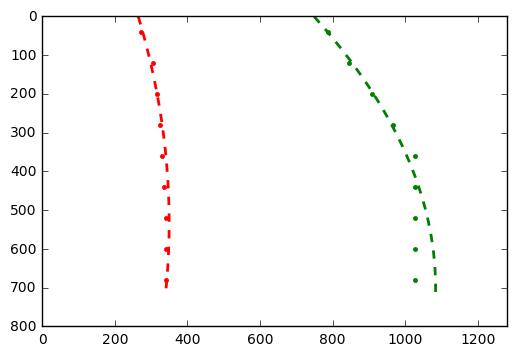

2323.83513612 m 6733.49661871 m
1701.54385461 px 735.052758857 px
--Make Overlay--
Left-Lane:
(array([ 264.49454551,  276.16164619,  286.96890313,  296.91631635,
        306.00388584,  314.2316116 ,  321.59949364,  328.10753194,
        333.75572653,  338.54407738,  342.47258451,  345.5412479 ,
        347.75006758,  349.09904352,  349.58817574,  349.21746423,
        347.98690899,  345.89651003,  342.94626734,  339.13618092]), array([   0.        ,   37.89473684,   75.78947368,  113.68421053,
        151.57894737,  189.47368421,  227.36842105,  265.26315789,
        303.15789474,  341.05263158,  378.94736842,  416.84210526,
        454.73684211,  492.63157895,  530.52631579,  568.42105263,
        606.31578947,  644.21052632,  682.10526316,  720.        ]))
Right-Lane:
(array([   0.        ,   37.89473684,   75.78947368,  113.68421053,
        151.57894737,  189.47368421,  227.36842105,  265.26315789,
        303.15789474,  341.05263158,  378.94736842,  416.84210526,
        454.73684

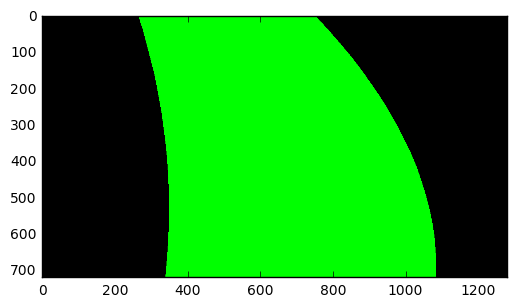

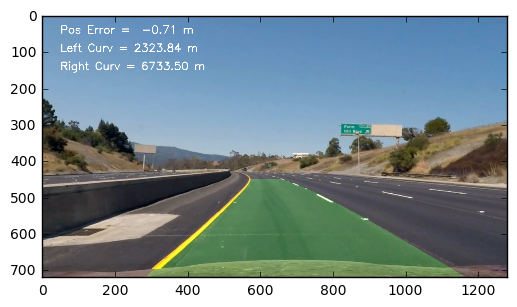

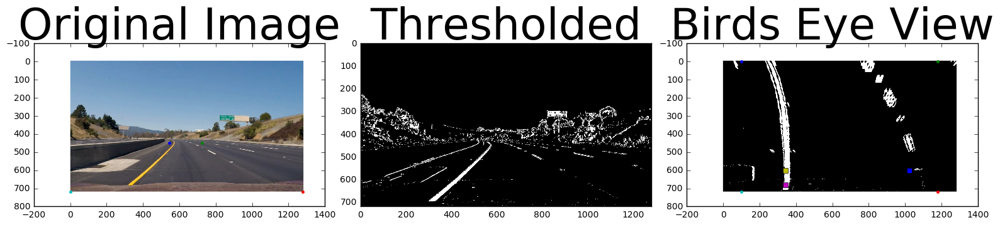

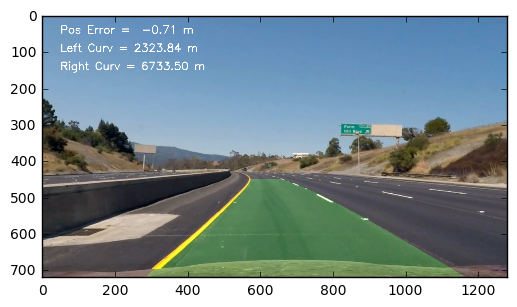

------ Frame 20 --------
(720, 1280, 3)


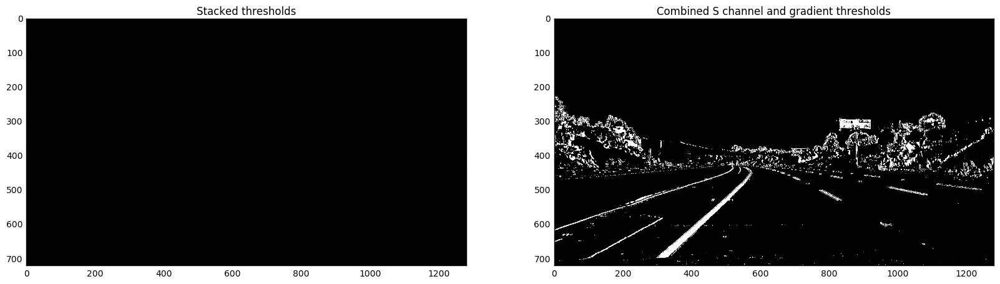

----- COARSE -------
Left peak is at 333
Right peak is at 1034
------ FINE --------
RIGHT: Proposed moving 0 px
RIGHT: Failed to re-detect lane.  Output stale X.
-- Box 0 --
Left X = 333 (2297 hits)
Right X = 1034 (209 hits)
RIGHT: Proposed moving 0 px
RIGHT: Failed to re-detect lane.  Output stale X.
-- Box 1 --
Left X = 333 (2695 hits)
Right X = 1034 (0 hits)
RIGHT: Proposed moving 0 px
RIGHT: Proposed moving 9 px
-- Box 2 --
Left X = 333 (3298 hits)
Right X = 1043 (1675 hits)
RIGHT: Proposed moving -5 px
RIGHT: Proposed moving -16 px
-- Box 3 --
Left X = 328 (3219 hits)
Right X = 1027 (1147 hits)
RIGHT: Proposed moving -13 px
RIGHT: Failed to re-detect lane.  Output stale X.
-- Box 4 --
Left X = 315 (3615 hits)
Right X = 1027 (479 hits)
RIGHT: Proposed moving 6 px
RIGHT: Proposed moving -70 px
-- Box 5 --
Left X = 321 (3577 hits)
Right X = 957 (1424 hits)
RIGHT: Proposed moving -13 px
RIGHT: Proposed moving -37 px
-- Box 6 --
Left X = 308 (2959 hits)
Right X = 920 (3037 hits)
RIGHT:

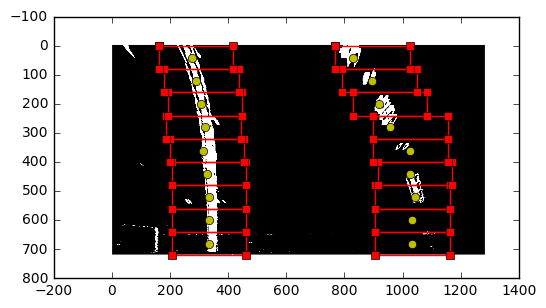

[[ 333.  680.]
 [ 333.  600.]
 [ 333.  520.]
 [ 328.  440.]
 [ 315.  360.]
 [ 321.  280.]
 [ 308.  200.]
 [ 290.  120.]
 [ 276.   40.]]
[[ 1034.   680.]
 [ 1034.   600.]
 [ 1043.   520.]
 [ 1027.   440.]
 [ 1027.   360.]
 [  957.   280.]
 [  920.   200.]
 [  896.   120.]
 [  830.    40.]]


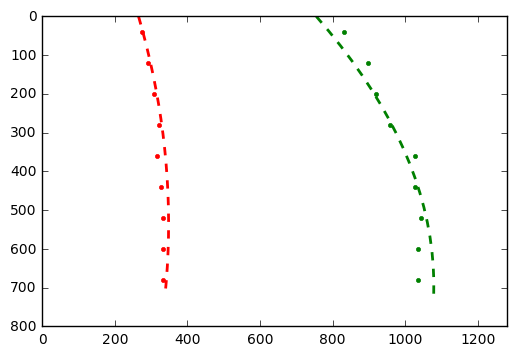

2257.67741829 m 6563.31377891 m
1758.6619597 px 747.404907842 px
--Make Overlay--
Left-Lane:
(array([ 265.26205246,  276.57158432,  287.05050271,  296.69880762,
        305.51649905,  313.503577  ,  320.66004147,  326.98589246,
        332.48112997,  337.145754  ,  340.97976455,  343.98316162,
        346.15594521,  347.49811532,  348.00967195,  347.6906151 ,
        346.54094477,  344.56066096,  341.74976367,  338.10825291]), array([   0.        ,   37.89473684,   75.78947368,  113.68421053,
        151.57894737,  189.47368421,  227.36842105,  265.26315789,
        303.15789474,  341.05263158,  378.94736842,  416.84210526,
        454.73684211,  492.63157895,  530.52631579,  568.42105263,
        606.31578947,  644.21052632,  682.10526316,  720.        ]))
Right-Lane:
(array([   0.        ,   37.89473684,   75.78947368,  113.68421053,
        151.57894737,  189.47368421,  227.36842105,  265.26315789,
        303.15789474,  341.05263158,  378.94736842,  416.84210526,
        454.736842

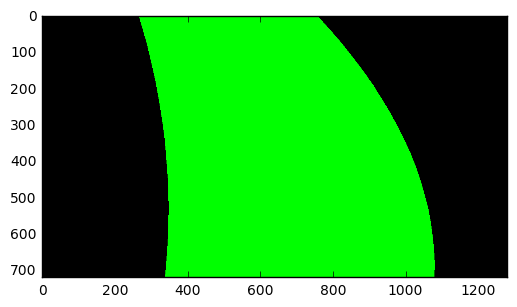

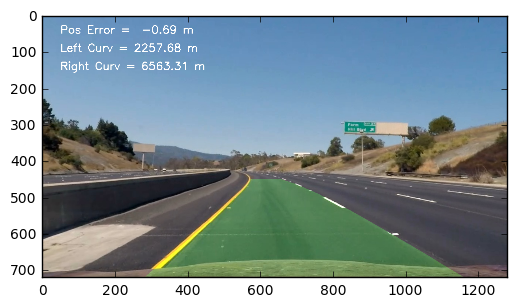

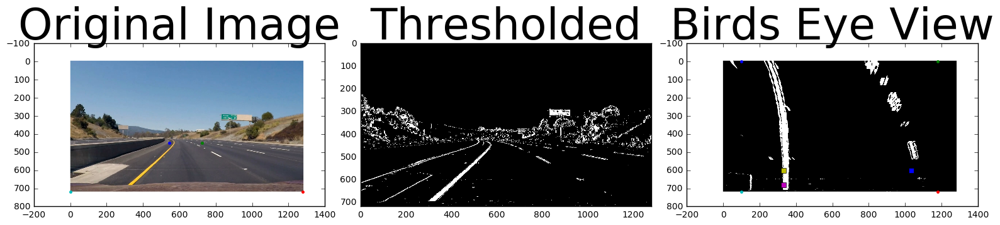

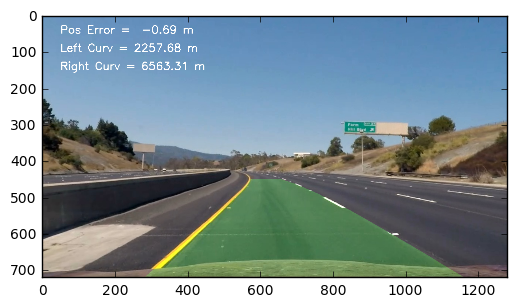

In [184]:
leftLane = Line(720)
rightLane = Line(720)
# test("test_images/solidYellowLeft.jpg", Debug=True)
# test("test_images/solidWhiteRight.jpg", Debug=True)

for i in range(10,22,2):
    print("------ Frame %d --------" % (i))
    test("project_video_frames/frame%d.jpg" %(i), Debug=True)

#test("project_video_frames/frame12.jpg", Debug=True)
#test("project_video_frames/frame14.jpg", Debug=True)
#test("project_video_frames/frame16.jpg", Debug=True)
#test("project_video_frames/frame18.jpg", Debug=True)
#test("project_video_frames/frame20.jpg", Debug=True)
# test("project_video_frames/frame1025.jpg", Debug=True)
# test("project_video_frames/frame542.jpg", Debug=True)
# test("project_video_frames/frame609.jpg", Debug=True) # <- causes problems

# test("project_video_frames/frame1042.jpg", Debug=True)

# Video Processing
I re-used this code from Project 1 for processing video clips.

In [113]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

def process_image(image):
    # NOTE: The output you return should be a color image (3 channel) for processing video below
    # TODO: put your pipeline here,
    # you should return the final output (image with lines are drawn on lanes)
    mtx, dist, M = setup()
    # thresholds = {'SobelX':[0, 255], 'hls':[100, 255]}
    result = processImg(image, mtx, dist, M, thresholds)
    return result

In [636]:
"""
Code snippet to extract every image from the video and save as a JPG image.  
This was used to obtain frames from the video that caused the pipeline trouble.
I found this code snippet on StackOverflow: 
http://stackoverflow.com/questions/33311153/python-extracting-and-saving-video-frames
"""
vidcap = cv2.VideoCapture('project_video.mp4')
success,image = vidcap.read()
count = 0
success = True
while success:
    success,image = vidcap.read()
    cv2.imwrite("frame%d.jpg" % count, image)     # save frame as JPEG file
    count += 1
print("Complete!")

KeyboardInterrupt: 

In [185]:
white_output = 'submission.mp4'
clip1 = VideoFileClip("project_video.mp4")

# Re-initialize fresh instances of the Line objects
imgHeight = 720 # px
leftLine = Line(imgHeight)
rightLine = Line(imgHeight)

# Process video
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video submission.mp4
[MoviePy] Writing video submission.mp4


100%|█████████▉| 1260/1261 [01:50<00:00, 11.37it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: submission.mp4 

CPU times: user 2min 46s, sys: 19.9 s, total: 3min 6s
Wall time: 1min 51s


In [154]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output))

